<a href="https://colab.research.google.com/github/ndlovuntando/Deep-Learning-Papers-Reading-Roadmap/blob/master/assignmentipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#install optuna
!pip install optuna

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd drive/MyDrive/flixbus/

/content/drive/MyDrive/flixbus


## Load the packages

In [ ]:
import pandas as pd
import numpy as np
import IPython
import plotly.figure_factory as ff
from IPython.display import display
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import plotly.offline as offline
import cufflinks as cf
cf.go_offline()

from collections import Counter
import warnings
warnings.filterwarnings("ignore")

from imblearn.over_sampling import SMOTE
import imblearn
import sklearn
from imblearn.under_sampling import RandomUnderSampler
from sklearn import linear_model, model_selection
from sklearn import ensemble
from sklearn.preprocessing import PowerTransformer
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.preprocessing import label_binarize
# import optuna
# from optuna.samplers import TPESampler
# from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, precision_recall_curve
from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, cross_val_score, GridSearchCV


In [ ]:
#configuring the plotly browser state
def configure_plotly_browser_state():
  '''Function for configuring plotly offline browser display'''

  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))
  
IPython.get_ipython().events.register('pre_run_cell', configure_plotly_browser_state)

In [ ]:
#We configure plotly browser
configure_plotly_browser_state()

> # Exploratory data analysis

In [ ]:
#Load the data
data = pd.read_csv('takehome_test_data.csv')

In [ ]:
# a glimpse into the data
data.head(4)

,day,account,account_id,campaign,campaign_id,ad,ad_id,clicks,impressions,cost,conversions,conversion_value,ad_position,ad_location
0,2018-11-01,Google PPC Account,1312,Bus Campaign,156935,Munich - Berlin,1236985744,57,525,18030000.0,0.45,6.71,Fourth,Bottom of the page
1,2018-11-02,Google PPC Account,1312,Bus Campaign,156935,Munich - Berlin,1236985744,40,453,11300000.0,4.02,158.52,Third,Top of the page
2,2018-11-03,Google PPC Account,1312,Bus Campaign,156935,Munich - Berlin,1236985744,32,375,8640000.0,0.00,0.00,Third,Top of the page
3,2018-11-04,Google PPC Account,1312,Bus Campaign,156935,Munich - Berlin,1236985744,42,493,11790000.0,0.06,0.13,Fourth,Bottom of the page


In [ ]:
print('Data has {} rows and {} columns'.format(data.shape[0],data.shape[1]))

Data has 395 rows and 14 columns


In [ ]:
# a look at the variable names 
data.columns

Index(['day', 'account', 'account_id', 'campaign', 'campaign_id', 'ad',
       'ad_id', 'clicks', 'impressions', 'cost', 'conversions',
       'conversion_value', 'ad_position', 'ad_location'],
      dtype='object')

In [ ]:
#check for missing values
data.isnull().values.any()

True

In [ ]:
#get the sum of missing value per row
total = data.isnull().sum().sort_values(ascending=False)

# get % of missing values per row
percentage = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending=False)

# combine total and percentage of missing values into single dataframe
pd.concat([total, percentage], axis=1, keys=['Total', 'Percent'])

,Total,Percent
cost,3,0.759494
ad_location,0,0.000000
ad_position,0,0.000000
conversion_value,0,0.000000
conversions,0,0.000000
impressions,0,0.000000
clicks,0,0.000000
ad_id,0,0.000000
ad,0,0.000000
campaign_id,0,0.000000


> * Since we have a very small fraction of rows with missing data. We can drop rows with missing data (for now). 

In [ ]:
#we drop the rows with missing values
data.dropna(inplace=True)

In [ ]:
# check data types
data.dtypes

day                  object
account              object
account_id            int64
campaign             object
campaign_id           int64
ad                   object
ad_id                 int64
clicks                int64
impressions           int64
cost                float64
conversions         float64
conversion_value    float64
ad_position          object
ad_location          object
dtype: object

In [ ]:
data.describe()

,account_id,campaign_id,ad_id,clicks,impressions,cost,conversions,conversion_value
count,392.0,392.0,3.920000e+02,392.000000,392.00000,3.920000e+02,392.000000,392.000000
mean,1312.0,156935.0,1.236986e+09,77.974490,634.12500,5.038130e+07,1.486939,67.339209
std,0.0,0.0,0.000000e+00,33.598264,208.07437,3.118345e+07,1.476114,71.138698
min,1312.0,156935.0,1.236986e+09,11.000000,-723.00000,2.850000e+06,0.000000,0.000000
25%,1312.0,156935.0,1.236986e+09,55.750000,547.75000,2.851500e+07,0.450000,13.757500
50%,1312.0,156935.0,1.236986e+09,80.000000,650.50000,4.676500e+07,1.175000,46.275000
75%,1312.0,156935.0,1.236986e+09,100.000000,760.00000,6.716250e+07,2.090000,96.455000
max,1312.0,156935.0,1.236986e+09,180.000000,1190.00000,1.566500e+08,15.040000,410.400000


> * Target variable is an object and if this data-type is correct we have to chech howmany categories it has. 

In [ ]:
#check howmany classes we have in the target variable
print('Target variable has {} categories.'.format(len(data['ad_position'].unique())))

Target variable has 5 categories.


> * We can approach this as a classification problem. We will have to look at the target variable class distribution so as to gain some intuition on the type of evaluaten metric to use.

In [ ]:
#check howmany classes we have in the target variable

object_columns = list(data.select_dtypes(include='object').columns)

for col in object_columns:
  print('{} variable has {} categories.'.format(col, len(data[col].unique())))

day variable has 392 categories.
account variable has 1 categories.
campaign variable has 1 categories.
ad variable has 1 categories.
ad_position variable has 5 categories.
ad_location variable has 2 categories.


> * We have to drop all single category columns. Before we drop the day column we can use it ot engineer some features.

In [ ]:
#convertion day column to pandas datetime

# the date below is incorect so we assume it should have been '2019-09-30'
data[data['day'] == '2019-09-31']

,day,account,account_id,campaign,campaign_id,ad,ad_id,clicks,impressions,cost,conversions,conversion_value,ad_position,ad_location
302,2019-09-31,Google PPC Account,1312,Bus Campaign,156935,Munich - Berlin,1236985744,128,1049,64030000.0,2.05,96.37,Fourth,Bottom of the page


In [ ]:
#check if 2019-09-30 exists
data[data['day'] == '2019-09-30']

,day,account,account_id,campaign,campaign_id,ad,ad_id,clicks,impressions,cost,conversions,conversion_value,ad_position,ad_location


In [ ]:
#correcting the date
data.at[302, 'day'] = '2019-09-30'

In [ ]:
#convert date column to datetime
data['day']= pd.to_datetime(data['day'])

In [ ]:
# get month of the year
data['month'] = pd.DatetimeIndex(data['day']).month
#get week of the year
# data['week'] = pd.DatetimeIndex(data['day']).week
#get day of week
data['day_of_week'] = pd.DatetimeIndex(data['day']).weekday


In [ ]:
#drop unnecessary columns
data.drop(['account','account_id','ad','ad_id', 'campaign', 'campaign_id', 'day'], axis=1, inplace=True)

> * We do not drop the ad_location variable for now, the reason being that we might later use it as a target varible for another model and combine (predicted value) it with the primary model. 

In [ ]:
data.columns

Index(['clicks', 'impressions', 'cost', 'conversions', 'conversion_value',
       'ad_position', 'ad_location', 'month', 'day_of_week'],
      dtype='object')

> * Now we explore the distribution of the different features.

In [ ]:
#function for plotting pie chart
def plot_pie_chart(col, df):
    '''function for plotting pie chart.
    
    Args
    ----
        df (DataFrame): pandas df to be used for plotting
        col (str): name of column to be used when plotting
    '''
    defaults = df[[col]]
    temp_ = defaults[col].value_counts()
    df_ = pd.DataFrame({'labels': temp_.index, 'values': temp_.values})
    df_.iplot(kind='pie', labels='labels', values='values', title= col) 


In [ ]:
#now we look at the distribution of the target variable
plot_pie_chart('ad_position', data)

In [ ]:
#now we look at the distribution of the target variable
plot_pie_chart('ad_location', data)

> * Class imbalance suggest that we will have to either employ oversmapling or set thresholds for the predicted probabilities. 

> * We shall use AURC as our evaluation metric. Thought this metric is affected by class imbalance, we employ the above metioned approaches to curb class imbalance.

In [ ]:
#now we look at the distribution of the day_of_week variable
plot_pie_chart('day_of_week', data)

> * day of week is (approx) evenly distributed . 

In [ ]:
#now we look at the distribution of the month
plot_pie_chart('month', data)

> * Month is evenly (aprox) distributed

In [ ]:
# gb = data.groupby(['week', 'month'], as_index=False).agg([actual = ('clicks', lambda x: np.max))

In [ ]:
data.shape

(392, 9)

In [ ]:
def plot_bar_with_default(col, df):
    ''' function that plots variable distribution based on loan default
    Args
    ----
        df (DataFrame): pandas dataframe containig necessary data
        col (str): name of dataframe colum to be used
    '''
    temp = df[col].value_counts()
    temp_y0 = []
    temp_y1 = []
    temp_y2 = []
    temp_y3 = []
    temp_y4 = []
    for val in temp.index:
        temp_y0.append(np.sum(df['ad_position'][df[col]==val] == 'First'))
        temp_y1.append(np.sum(df['ad_position'][df[col]==val] == 'Second')) 
        temp_y2.append(np.sum(df['ad_position'][df[col]==val] == 'Third')) 
        temp_y3.append(np.sum(df['ad_position'][df[col]==val] == 'Fourth')) 
        temp_y4.append(np.sum(df['ad_position'][df[col]==val] == 'Fifth'))    
        trace1 = go.Bar(x = temp.index,y = (temp_y0 / temp.sum()) * 100, name='1st')
        trace2 = go.Bar(x = temp.index,y = (temp_y1 / temp.sum()) * 100, name='2nd')
        trace3 = go.Bar(x = temp.index,y = (temp_y2 / temp.sum()) * 100, name='3rd')
        trace4 = go.Bar(x = temp.index,y = (temp_y3 / temp.sum()) * 100, name='4th')
        trace5 = go.Bar(x = temp.index,y = (temp_y4 / temp.sum()) * 100, name='5th')

    data = [trace1, trace2, trace3, trace4, trace5]
    layout = go.Layout(title = "{} distribution relative to the ad_position in %".format(col),
                  width = 1000,xaxis=dict(title=col,tickfont=dict(size=14,color='rgb(107, 107, 107)')),
                          yaxis=dict(title='Count in %',titlefont=dict(size=16,color='rgb(107, 107, 107)'),tickfont=dict(size=14,
                            color='rgb(107, 107, 107)')))

    fig = go.Figure(data=data, layout=layout)
    iplot(fig)

In [ ]:
def plot_bar_with_default_2(col, df):
    ''' function that plots variable distribution based on loan default
    Args
    ----
        df (DataFrame): pandas dataframe containig necessary data
        col (str): name of dataframe colum to be used
    '''
    temp = df[col].value_counts()
    temp_y0 = []
    temp_y1 = []
    temp_y2 = []
    temp_y3 = []
    temp_y4 = []
    for val in temp.index:
        temp_y0.append(np.sum(df['ad_location'][df[col]==val] == 'Top of the page'))
        temp_y1.append(np.sum(df['ad_location'][df[col]==val] == 'Bottom of the page')) 
        # temp_y2.append(np.sum(df['ad_location'][df[col]==val] == 'Third')) 
        # temp_y3.append(np.sum(df['ad_location'][df[col]==val] == 'Fourth')) 
        # temp_y4.append(np.sum(df['ad_location'][df[col]==val] == 'Fifth'))    
        trace1 = go.Bar(x = temp.index,y = (temp_y0 / temp.sum()) * 100, name='Top')
        trace2 = go.Bar(x = temp.index,y = (temp_y1 / temp.sum()) * 100, name='Bottom')
        # trace3 = go.Bar(x = temp.index,y = (temp_y2 / temp.sum()) * 100, name='3rd')
        # trace4 = go.Bar(x = temp.index,y = (temp_y3 / temp.sum()) * 100, name='4th')
        # trace5 = go.Bar(x = temp.index,y = (temp_y4 / temp.sum()) * 100, name='5th')

    data = [trace1, trace2]
    layout = go.Layout(title = "{} distribution relative to the ad_position in %".format(col),
                  width = 1000,xaxis=dict(title=col,tickfont=dict(size=14,color='rgb(107, 107, 107)')),
                          yaxis=dict(title='Count in %',titlefont=dict(size=16,color='rgb(107, 107, 107)'),tickfont=dict(size=14,
                            color='rgb(107, 107, 107)')))

    fig = go.Figure(data=data, layout=layout)
    iplot(fig)

In [ ]:
#distribution of target variable per month
plot_bar_with_default('month', data)

In [ ]:
#distribution of target variable per month
plot_bar_with_default_2('month', data)

In [ ]:
#distribution of ad_location per ad_position
plot_bar_with_default('ad_location', data)

> * of the top page ads the 3rd ad_position had the higherst fraction. 

> * As expected the bottom page class had 2 ad_position classes with 4th ad_position having the largest fraction. 

In [ ]:
def plot_bar(col, df):
    '''function for plotting bar chart
    
    Args
    ----
       df (DataFrame): pandas dataframe containig necessary data
       col (str): name of dataframe colum to be used
    
    '''
    temp = df[col].value_counts()
    temp.iplot(kind='bar', xTitle = col, yTitle = "Count", title = col, color = 'blue')

In [ ]:
plot_bar('clicks', data)

In [ ]:
# data.describe()

In [ ]:
def plot_dist(col, bs,df):
    '''function for plotting bar chart
    
    Args
    ----
       df (DataFrame): pandas dataframe containig necessary data
       col (str): name of dataframe colum to be used
    
    '''
    colors = ['#7FA6EE']
    temp = df[col].values
    fig = ff.create_distplot([temp],group_labels=[col],bin_size=bs,curve_type='normal',colors=colors)
    fig.update_layout(title_text='{} distplot with normal nistribution'.format(col))
    fig.show()



In [ ]:
plot_dist('clicks', 2,data)

In [ ]:
plot_dist('conversions', 0.2,data)

> * conversions are positively skewed, so we perform a cube-root transform on it so as to normalize and curb the outliers. 

In [ ]:
#take the cube-root of vonversions column
data['conversions'] = np.cbrt(data['conversions'])

In [ ]:
#plot the conversions column again to see the new distribution
plot_dist('conversions', 0.2,data)

In [ ]:
#plot impressions distribution
plot_dist('impressions', 7,data)

> * We have outliers with negative values. We might have to drop those or take their abs values then the log.

In [ ]:
#taking the abs of impressions values 
data['impressions'] = abs(data['impressions'])

In [ ]:
#a glimpse of the new impressions distribution
plot_dist('impressions', 7,data)

In [ ]:
#plot distribution of conversion_value
plot_dist('conversion_value', 5,data)

> * conversion value has outliers so we might have to transform this and all other columns with outliers. 

In [ ]:
#get the cube-root of conversion value
data['conversion_value'] = np.cbrt(data['conversion_value'])

#plot new distribution of conversion_value
plot_dist('conversion_value', 0.4,data)

In [ ]:
# dumy_data = data

In [ ]:
data['cost'] = np.cbrt(data['cost'])

In [ ]:
# dumy_data.replace([np.inf, -np.inf], 0, inplace=True)
# dumy_data.replace([np.nan, -np.nan], 0, inplace=True)

In [ ]:
#plot dist of cost variable
plot_dist('cost', 5,data)

In [ ]:
#encoding of categorical varibles
cleanup_position = {"ad_position":     {"First": 0, "Second": 1, "Third": 2, "Fourth": 3, "Fifth": 4}}
cleanup_location = {"ad_location":     {"Bottom of the page": 0, "Top of the page": 1}}

data_clean = data.replace(cleanup_position)
data_clean = data_clean.replace(cleanup_location)

,clicks,impressions,cost,conversions,conversion_value,ad_position,ad_location,month,day_of_week
0,57,525,262.219655,0.766309,1.886141,3,0,11,3
1,40,453,224.401703,1.590042,5.412044,2,1,11,4
2,32,375,205.197114,0.000000,0.000000,2,1,11,5
3,42,493,227.599482,0.391487,0.506580,3,0,11,6
4,44,502,241.358042,0.866239,4.910957,2,1,11,0


In [ ]:
data_clean['with_one'] = np.where(data_clean.month.isin([1,2]), 1, 0)
data_clean['with_four'] = np.where(data_clean.month.isin([2,3,10,11]), 1, 0)

In [ ]:
data_clean.head()

,clicks,impressions,cost,conversions,conversion_value,ad_position,ad_location,month,day_of_week,with_one,with_four
0,57,525,262.219655,0.766309,1.886141,3,0,11,3,0,1
1,40,453,224.401703,1.590042,5.412044,2,1,11,4,0,1
2,32,375,205.197114,0.000000,0.000000,2,1,11,5,0,1
3,42,493,227.599482,0.391487,0.506580,3,0,11,6,0,1
4,44,502,241.358042,0.866239,4.910957,2,1,11,0,0,1


In [ ]:
data_clean["ad_position"] = data_clean["ad_position"].astype('category')
data_clean["ad_location"] = data_clean["ad_location"].astype('category')
data_clean["day_of_week"] = data_clean["day_of_week"].astype('category')
data_clean["with_one"] = data_clean["with_one"].astype('category')
data_clean["with_four"] = data_clean["with_four"].astype('category')
data_clean["month"] = data_clean["month"].astype('category')

In [ ]:
md = data_clean.groupby(['month','day_of_week'], as_index=False).agg({'clicks': ['mean', 'min','max'], 
                  'cost': ['mean', 'min','max'], 'conversion_value': ['mean', 'min','max'],
                   'impressions': ['mean', 'min','max'], 'conversions': ['mean', 'min','max']})
data_clean = pd.merge(data_clean, md, how='left', on= ['month','day_of_week'])

In [ ]:
wm = data_clean.groupby(['with_one','with_four'], as_index=False).agg({'clicks': ['mean', 'min','max'], 
                  'cost': ['mean', 'min','max'], 'conversion_value': ['mean', 'min','max'],
                   'impressions': ['mean', 'min','max'], 'conversions': ['mean', 'min','max']})
data_clean = pd.merge(data_clean, wm, how='left', on= ['with_one','with_four'])

> ## Plot correlation of numerical variables

In [ ]:
#select all numerical variables
numeric_types =  data_clean.select_dtypes(['int64','float64'])

In [ ]:
#plot correlation heatmap
data = [go.Heatmap(z= numeric_types.corr().values,x=numeric_types.columns.values,y=numeric_types.columns.values,colorscale='RdYlBu_r',
                   reversescale = False,opacity = 1.0 )]
layout = go.Layout(title='Pearson Correlation of features',xaxis = dict(ticks='', nticks=36),
                  yaxis = dict(ticks='' ),width = 900, height = 700,margin=dict(l=240,),)

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='labelled-heatmap')



> * There are a number of features that are highly correlated. 

> * We shall drop one of the higly correlated paired features.

In [ ]:
# drop all features with pearson correlation higher than 0.8
corr = numeric_types.corr()
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >= 0.8:
            if columns[j]:
                columns[j] = False

selected_columns = numeric_types.columns[columns]
data_fianl = numeric_types[selected_columns]

In [ ]:
#plot the new correlation heatmap
data = [go.Heatmap(z= data_fianl.corr().values,x=data_fianl.columns.values,y=data_fianl.columns.values,colorscale='RdYlBu_r',
                   reversescale = False,opacity = 1.0 )]
layout = go.Layout(title='Pearson Correlation of features',xaxis = dict(ticks='', nticks=36),
                  yaxis = dict(ticks='' ),width = 900, height = 700,margin=dict(l=240,),)

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='labelled-heatmap')

In [ ]:
# combine all the final features
final_columns = list(data_fianl.columns)
final_columns.extend(['ad_position','ad_location','with_one','with_four'])

In [ ]:
# get the final dataframe
data_clean_final = data_clean[final_columns]

In [ ]:
# summary statistics for the new dataframe
data_clean_final.describe()

,clicks_x,conversions_x,"('clicks', 'mean')_x","('clicks', 'max')_x","('conversion_value', 'mean')_x","('conversion_value', 'max')_x","('impressions', 'max')_x","('conversions', 'max')_x","(clicks_y, mean)","(clicks_y, min)","(cost_y, mean)","(conversion_value_y, min)","(conversions_y, min)","(conversions_y, max)"
count,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.0,392.0,392.000000
mean,77.974490,0.999682,77.974490,103.484694,3.418156,5.133287,787.737245,1.427070,77.974490,13.803571,350.796186,0.0,0.0,2.061708
std,33.598264,0.421073,26.397633,24.637521,0.958795,1.062809,130.402916,0.254293,10.606228,2.424236,38.970125,0.0,0.0,0.234840
min,11.000000,0.000000,31.250000,54.000000,0.973530,2.644786,562.000000,0.754784,50.290323,11.000000,279.010638,0.0,0.0,1.756574
25%,55.750000,0.766309,58.400000,83.000000,2.601962,4.238422,685.000000,1.278543,79.385246,12.000000,319.706358,0.0,0.0,1.756574
50%,80.000000,1.055225,71.750000,101.000000,3.351631,5.247179,777.000000,1.401020,83.943396,12.000000,385.394741,0.0,0.0,2.201514
75%,100.000000,1.278543,98.500000,122.000000,4.225700,6.007491,875.000000,1.576747,83.943396,17.000000,385.394741,0.0,0.0,2.201514
max,180.000000,2.468402,154.750000,180.000000,5.463115,7.431374,1190.000000,2.468402,83.943396,17.000000,385.394741,0.0,0.0,2.468402


In [ ]:
# data_clean.at[0, 'cost']

In [ ]:
# data_clean_final.columns

In [ ]:
#split the data into train, test set at a ratio of 70:30
X_pos = data_clean.drop(['ad_position', 'ad_location'], axis = 1)
y_pos = data_clean['ad_position']

X_loc = data_clean.drop(['ad_location','ad_position'], axis = 1)
y_loc = data_clean['ad_location']

X_train_pos, X_test_pos, y_train_pos, y_test_pos = train_test_split(X_pos, y_pos, test_size = 0.4, random_state = 42, stratify = y_pos)

X_train_loc, X_test_loc, y_train_loc, y_test_loc = train_test_split(X_loc, y_loc, test_size = 0.4, random_state = 42, stratify = y_loc)

In [ ]:

from sklearn.preprocessing import LabelEncoder
# label encode the target variable
y = LabelEncoder().fit_transform(y_train_pos)

In [ ]:
# #oversampling with smote
# k=5 ; seed = 100
# strategy = {0:245, 1:254}
# oversample = SMOTE(kind='regular', sampling_strategy=strategy,k_neighbors=2) #SMOTE(sampling_strategy=strategy, random_state=seed)
# X_train_2, y_train_2 = oversample.fit_resample(X_train_loc, y_train_loc)
# # summarize the new class distribution
# counter = Counter(y_train_2)
# print(counter)

# #convert sapled data into dataframe
# X_train_loc_2 = pd.DataFrame(data=X_train_2, columns=list(X_train_2.columns))
# y_train_loc_2 = pd.DataFrame(data=y_train_2)

In [ ]:
...
# transform the dataset
# strategy = {0:100, 1:100, 2:200, 3:200, 4:200}
# oversample = SMOTE(kind='regular',k_neighbors=5)
# X, y = oversample.fit_resample(X_train_loc, y_train_loc)
# x_train = X_train_pos[cols] #['clicks', 'impressions', 'cost', 'conversions', 'conversion_value']]
#oversampling with smote
k=3 ; seed = 100
# strategy = {0:100, 1:50, 2:188, 3:96, 4:100}
strategy = {0:100, 1:100, 2:188, 3:137, 4:100}
oversample = SMOTE(kind='regular', sampling_strategy=strategy,k_neighbors=3
                   , random_state=seed) #SMOTE(sampling_strategy=strategy, random_state=seed)
X_train_2, y_train_2 = oversample.fit_resample(X_train_pos, y_train_pos)
# summarize the new class distribution
counter = Counter(y_train_2)
print(counter)

#convert sapled data into dataframe
X_train_2 = pd.DataFrame(data=X_train_2, columns=list(X_train_pos.columns))
y_train_2 = pd.DataFrame(data=y_train_2)

Counter({2: 188, 3: 137, 4: 100, 1: 100, 0: 100})


> # Model training. 

* We begin by training our medels with the ad_position as the target variable. 

* We employ optuna for model selction and hyperparameter tunning. 

In [ ]:
def objective(trial):
    """function for optimising machine learning classifiers and their respective hyperparameters
    Arg
    ---
       trial: trial is a process of evaluating an objective function. This object is passed to an objective 
              function and provides interfaces to get parameter suggestion.
    """

    #define the trial suggested classifiers
    classifier_name = trial.suggest_categorical("classifier", ["RandomForest", "SVC"])  #"SVC",
    #conditionals for classifier hyper-parameter optimisation
    if classifier_name == "SVC":
        #support vector clssiffier hyper-parameters 
        svr_c = trial.suggest_loguniform('svr_c', 1e-10, 1e10)
        # define svc model
        classifier_obj = sklearn.svm.SVC(C=svr_c, probability=True)
        # trial.set_user_attr(key="best_model", value=svm)

    else:
        #rf hype-parameters
        rf_max_depth = trial.suggest_int("rf_max_depth", 2, 32, log=True)
        n_est = trial.suggest_int("n_est",10, 150)
        # w = trial.suggest_int('w',1,10)
        # w_1 = trial.suggest_int('w_1',1,10)
        min_sleaf = trial.suggest_int("min_sleaf",1, 5)
        classifier_obj = sklearn.ensemble.RandomForestClassifier(max_depth=rf_max_depth, n_estimators=n_est, min_samples_leaf=min_sleaf)
    

    score = sklearn.model_selection.cross_val_score(classifier_obj, X_train_2, y_train_2, n_jobs=-1, cv=3, scoring = 'roc_auc_ovr')
    best_auroc = score.mean()
    return best_auroc

if __name__ == "__main__":
    # Make the sampler behave in a deterministic way.
    sampler = TPESampler(seed=2)
    #configure the study
    study = optuna.create_study(direction="maximize", sampler=sampler)
    #define number of trials to perform
    study.optimize(objective, n_trials=200)
    #print the best trial results
    print(study.best_trial)

[I 2021-02-15 23:54:44,933] A new study created in memory with name: no-name-7a4788ab-993e-4581-a16e-c6121e9e4924
[I 2021-02-15 23:54:45,425] Trial 0 finished with value: 0.9745620715952765 and parameters: {'classifier': 'RandomForest', 'rf_max_depth': 6, 'n_est': 82, 'min_sleaf': 4}. Best is trial 0 with value: 0.9745620715952765.
[I 2021-02-15 23:54:46,074] Trial 1 finished with value: 0.9750912655725404 and parameters: {'classifier': 'RandomForest', 'rf_max_depth': 6, 'n_est': 114, 'min_sleaf': 3}. Best is trial 1 with value: 0.9750912655725404.
[I 2021-02-15 23:54:46,522] Trial 2 finished with value: 0.9287266898584118 and parameters: {'classifier': 'RandomForest', 'rf_max_depth': 2, 'n_est': 85, 'min_sleaf': 3}. Best is trial 1 with value: 0.9750912655725404.
[I 2021-02-15 23:54:47,263] Trial 3 finished with value: 0.9785844812453189 and parameters: {'classifier': 'RandomForest', 'rf_max_depth': 11, 'n_est': 126, 'min_sleaf': 4}. Best is trial 3 with value: 0.9785844812453189.
[I 

In [ ]:
def model_svm(X_train,X_test,y_train):
    """function that trains the modela and thereafter predicts the target variable on the test-set using the RandomForestClassifier.
    Args
    ----
        X_train (DataFrame): dataframe of training-set independet features.
        X_test (DataFrame): dataframe of test-set independent features.
        y_train (DataFrame): dataframe of training-set dependet features.
    Returns:
            y_pred (np.array): array of test-set predicted variable.
            -model.best_score_ (float): best AUC obtained during training
    """
    #study.best_trial.params['n_est'] 
    weights = {1:1, 2:1.0, 3:2.0, 4:5.0, 0:10.0}
    svm_clf = sklearn.svm.SVC(probability=True)# 'balanced') #, class_weight={0:3, 1:110}
    param_grid = {'C':[study.best_trial.params['svr_c']]}
    model = GridSearchCV(estimator=svm_clf, param_grid=param_grid, n_jobs=-1, cv=3, scoring='roc_auc_ovr',verbose=-1)
    %time model.fit(X_train, y_train)
    print('Random forecast classifier...')
    print('Best CV Score: {}'.format(round(model.best_score_,4)))

    y_pred_prob = model.predict_proba(X_test)
    y_pred = model.predict(X_test)
    return y_pred,y_pred_prob, round(model.best_score_,3), model

In [ ]:
y_pred_pos,y_pred_prob_pos ,score, model = model_svm(X_train_2,X_test_pos,y_train_2)

NameError: ignored

In [ ]:
def model_random_forecast(X_train,X_test,y_train):
    """function that trains the modela and thereafter predicts the target variable on the test-set using the RandomForestClassifier.
    Args
    ----
        X_train (DataFrame): dataframe of training-set independet features.
        X_test (DataFrame): dataframe of test-set independent features.
        y_train (DataFrame): dataframe of training-set dependet features.
    Returns:
            y_pred (np.array): array of test-set predicted variable.
            -model.best_score_ (float): best AUC obtained during training
    """
    #study.best_trial.params['n_est'] 
    weights = {1:1, 2:1.0, 3:2.0, 4:5.0, 0:10.0}
    rfr = sklearn.ensemble.RandomForestClassifier(n_jobs=-1, random_state=0, bootstrap=False, class_weight= weights)# 'balanced') #, class_weight={0:3, 1:110}
    param_grid = {'n_estimators':[study.best_trial.params['n_est']], 'max_features': ['auto'], 'max_depth':[study.best_trial.params['rf_max_depth']], 'min_samples_leaf':[study.best_trial.params['min_sleaf']]}
    model = GridSearchCV(estimator=rfr, param_grid=param_grid, n_jobs=-1, cv=3, scoring='roc_auc_ovr',verbose=-1)
    %time model.fit(X_train, y_train)
    print('Random forecast classifier...')
    print('Best CV Score: {}'.format(round(model.best_score_,4)))

    y_pred_prob = model.predict_proba(X_test)
    y_pred = model.predict(X_test)
    return y_pred,y_pred_prob, round(model.best_score_,3), model

In [ ]:
# y_pred_pos,y_pred_prob_pos ,score, model = model_random_forecast(X_train_2,X_test_pos,y_train_2)

> Visualising feature importance

In [ ]:
feature_imp = pd.Series(model.best_estimator_.feature_importances_, index=X_train_2.columns.values).sort_values(ascending=False)
feature_importance = pd.DataFrame({'feature': list(feature_imp.index), 'score': list(feature_imp.values)})
#print("Accuracy: {}".format(metrics.accuracy_score(y_test, y_pred)))

import plotly.express as px

fig = px.bar(feature_importance, x='feature', y='score', color='feature',
             labels={'score':'Feature Importance Score'}, height=400)
fig.show()


In [ ]:
#get the top 6 features
new_features = list(feature_importance[feature_importance['score'] > 0.05]['feature'].values)

In [ ]:
y_pred_pos,y_pred_prob_pos ,score, model = model_random_forecast(X_train_2[new_features],X_test_pos[new_features],y_train_2)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    2.4s finished


CPU times: user 372 ms, sys: 66.5 ms, total: 439 ms
Wall time: 2.72 s
Random forecast classifier...
Best CV Score: 0.9775


In [ ]:
# You need the labels to binarize
labels = [0, 1, 2, 3, 4]

ytest  = list(y_test_pos)
# Binarize ytest with shape (n_samples, n_classes)
ytest = label_binarize(ytest, classes=labels)

# Binarize ypreds with shape (n_samples, n_classes)
ypreds = label_binarize(y_pred_pos, classes=labels)


roc_auc_score(ytest, ypreds,average='macro',multi_class='ovr')

0.7759438351743286

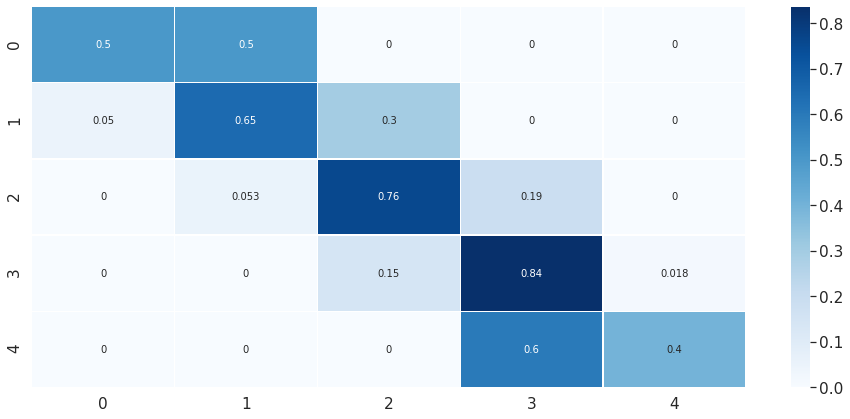

In [ ]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test_pos, y_pred_pos)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)


Whenever 1 is highest and 0 the second hih

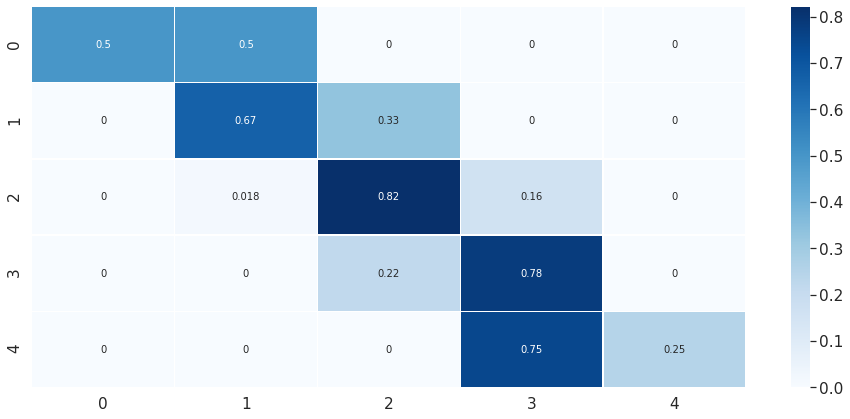

In [ ]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test_pos, y_pred_pos)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)


In [ ]:
#split the data into train, test set at a ratio of 70:30
X_pos = data_clean[data_clean.ad_position.isin([0, 1])].drop(['ad_position', 'ad_location'], axis = 1)
y_pos = data_clean[data_clean.ad_position.isin([0, 1])]['ad_position']

X_train_pos_1, X_test_pos_1, y_train_pos_1, y_test_pos_1 = train_test_split(X_pos, y_pos, test_size = 0.3, random_state = 42, stratify = y_pos)


In [ ]:
y_pred_pos,y_pred_prob_pos ,score = model_random_forecast(X_train_pos,X_test_pos_1,y_train_pos)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    2.1s finished


CPU times: user 325 ms, sys: 69.8 ms, total: 395 ms
Wall time: 2.43 s
Random forecast classifier...
Best CV Score: 0.8983


In [ ]:
# You need the labels to binarize
labels = [0, 1, 2, 3, 4]

ytest  = list(y_test_pos_1)
# Binarize ytest with shape (n_samples, n_classes)
ytest = label_binarize(ytest, classes=labels)

# Binarize ypreds with shape (n_samples, n_classes)
ypreds = label_binarize(y_pred_pos, classes=labels)


roc_auc_score(ytest, ypreds,average='macro',multi_class='ovr')

ValueError: ignored

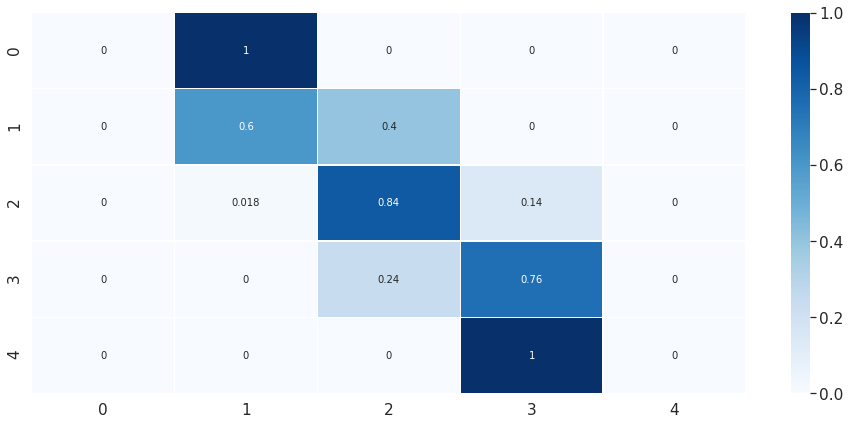

In [ ]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test_pos, y_pred_pos)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)


In [ ]:
y_pred_pos,y_pred_prob_pos ,score = model_random_forecast(X_train_2,X_train_2,y_train_2)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.1s finished


CPU times: user 554 ms, sys: 53.1 ms, total: 607 ms
Wall time: 1.6 s
Random forecast classifier...
Best CV Score: 0.9941


In [ ]:
len(y_train_2), len(y_pred_pos)

(940, 940)

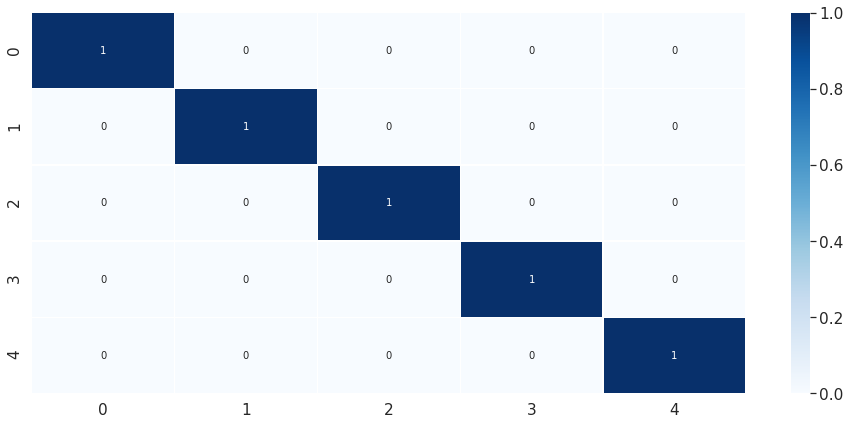

In [ ]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_train_2, y_pred_pos)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)


In [ ]:
def model_random_forecast(X_train,X_test,y_train):
    """function that trains the modela and thereafter predicts the target variable on the test-set using the RandomForestClassifier.
    Args
    ----
        X_train (DataFrame): dataframe of training-set independet features.
        X_test (DataFrame): dataframe of test-set independent features.
        y_train (DataFrame): dataframe of training-set dependet features.
    Returns:
            y_pred (np.array): array of test-set predicted variable.
            -model.best_score_ (float): best AUC obtained during training
    """
    #study.best_trial.params['n_est'] 
    weights = {1:1, 2:1.0, 3:2.0, 4:5.0, 0:10.0}
    rfr = sklearn.ensemble.RandomForestClassifier(n_jobs=-1, random_state=0, bootstrap=False, class_weight='balanced') #, class_weight={0:3, 1:110}
    param_grid = {'n_estimators':[study.best_trial.params['n_est']], 'max_features': ['auto'], 'max_depth':[study.best_trial.params['rf_max_depth']], 'min_samples_leaf':[study.best_trial.params['min_sleaf']]}
    model = GridSearchCV(estimator=rfr, param_grid=param_grid, n_jobs=-1, cv=3, scoring='roc_auc_ovr',verbose=-1)
    %time model.fit(X_train, y_train)
    print('Best CV Score: {}'.format(round(model.best_score_,4)))

    y_pred_prob = model.predict_proba(X_test)
    y_pred = model.predict(X_test)
    return y_pred,y_pred_prob, round(model.best_score_,3)

In [ ]:
def objective(trial):
    """function for optimising machine learning classifiers and their respective hyperparameters
    Arg
    ---
       trial: trial is a process of evaluating an objective function. This object is passed to an objective 
              function and provides interfaces to get parameter suggestion.
    """

    #define the trial suggested classifiers
    classifier_name = trial.suggest_categorical("classifier", ["SVC", "RandomForest"]) 
    #conditionals for classifier hyper-parameter optimisation
    if classifier_name == "SVC":
        #support vector clssiffier hyper-parameters 
        svr_c = trial.suggest_loguniform('svr_c', 1e-10, 1e10)
        # define svc model
        classifier_obj = sklearn.svm.SVC(C=svr_c, probability=True)
        # trial.set_user_attr(key="best_model", value=svm)

    else:
        #rf hype-parameters
        rf_max_depth = trial.suggest_int("rf_max_depth", 2, 32, log=True)
        n_est = trial.suggest_int("n_est",10, 150)
        w = trial.suggest_int('w',1,10)
        w_1 = trial.suggest_int('w_1',1,10)
        min_sleaf = trial.suggest_int("min_sleaf",1, 5)
        classifier_obj = sklearn.ensemble.RandomForestClassifier(max_depth=rf_max_depth,
                                                                 n_estimators=n_est,
                                                                 min_samples_leaf=min_sleaf,
                                                                 class_weight={0:w_1, 1: w})
    

    score = sklearn.model_selection.cross_val_score(classifier_obj, X_train_loc, y_train_loc, n_jobs=-1, cv=3, scoring = 'roc_auc')
    best_auroc = score.mean()
    return best_auroc

if __name__ == "__main__":
    # Make the sampler behave in a deterministic way.
    sampler = TPESampler(seed=2)
    #configure the study
    study = optuna.create_study(direction="maximize", sampler=sampler)
    #define number of trials to perform
    study.optimize(objective, n_trials=5)
    #print the best trial results
    print(study.best_trial)

[I 2021-02-15 17:12:32,482] A new study created in memory with name: no-name-41b1797f-9b7f-4505-afe6-a5fccfe696f8
[I 2021-02-15 17:12:32,523] Trial 0 finished with value: 0.9853734374008503 and parameters: {'classifier': 'SVC', 'svr_c': 5.03085225753886e-07}. Best is trial 0 with value: 0.9853734374008503.
[I 2021-02-15 17:12:32,559] Trial 1 finished with value: 0.7026619709372423 and parameters: {'classifier': 'SVC', 'svr_c': 9.84576708141957}. Best is trial 0 with value: 0.9853734374008503.
[I 2021-02-15 17:12:32,594] Trial 2 finished with value: 0.6929532330731645 and parameters: {'classifier': 'SVC', 'svr_c': 0.49542958315847585}. Best is trial 0 with value: 0.9853734374008503.
[I 2021-02-15 17:12:33,023] Trial 3 finished with value: 0.9901960784313726 and parameters: {'classifier': 'RandomForest', 'rf_max_depth': 4, 'n_est': 105, 'w': 6, 'w_1': 5, 'min_sleaf': 5}. Best is trial 3 with value: 0.9901960784313726.
[I 2021-02-15 17:12:33,057] Trial 4 finished with value: 0.70266197093

FrozenTrial(number=3, values=[0.9901960784313726], datetime_start=datetime.datetime(2021, 2, 15, 17, 12, 32, 595413), datetime_complete=datetime.datetime(2021, 2, 15, 17, 12, 33, 23302), params={'classifier': 'RandomForest', 'rf_max_depth': 4, 'n_est': 105, 'w': 6, 'w_1': 5, 'min_sleaf': 5}, distributions={'classifier': CategoricalDistribution(choices=('SVC', 'RandomForest')), 'rf_max_depth': IntLogUniformDistribution(high=32, low=2, step=1), 'n_est': IntUniformDistribution(high=150, low=10, step=1), 'w': IntUniformDistribution(high=10, low=1, step=1), 'w_1': IntUniformDistribution(high=10, low=1, step=1), 'min_sleaf': IntUniformDistribution(high=5, low=1, step=1)}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=3, state=TrialState.COMPLETE, value=None)


In [ ]:
def model_random_forecast(X_train,X_test,y_train):
    """function that trains the modela and thereafter predicts the target variable on the test-set using the RandomForestClassifier.
    Args
    ----
        X_train (DataFrame): dataframe of training-set independet features.
        X_test (DataFrame): dataframe of test-set independent features.
        y_train (DataFrame): dataframe of training-set dependet features.
    Returns:
            y_pred (np.array): array of test-set predicted variable.
            -model.best_score_ (float): best AUC obtained during training
    """
    #study.best_trial.params['n_est']
    weights = {0:20, 1:3}
    rfr = sklearn.ensemble.RandomForestClassifier(n_jobs=-1, random_state=0, bootstrap=False, class_weight=weights) #, class_weight={0:3, 1:110}
    param_grid = {'n_estimators':[study.best_trial.params['n_est']], 'max_features': ['auto'], 'max_depth':[study.best_trial.params['rf_max_depth']], 'min_samples_leaf':[study.best_trial.params['min_sleaf']]}
    model = GridSearchCV(estimator=rfr, param_grid=param_grid, n_jobs=-1, cv=3, scoring='roc_auc',verbose=-1)
    %time model.fit(X_train, y_train)
    print('Random forecast classifier...')
    print('Best CV Score: {}'.format(round(model.best_score_,4)))

    y_pred_prob = model.predict_proba(X_test)
    y_pred = model.predict(X_test)
    return y_pred,y_pred_prob, round(model.best_score_,3)

In [ ]:
study.best_trial.params['n_est']

105

In [ ]:
y_pred_test,y_pred_prob_test ,score = model_random_forecast(X_train_loc,X_test_loc,y_train_loc)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.8s finished


CPU times: user 213 ms, sys: 32.8 ms, total: 246 ms
Wall time: 1.03 s
Random forecast classifier...
Best CV Score: 0.9282


In [ ]:
#model evaluation
round(roc_auc_score(y_test_loc, y_pred_test), 2)

0.5

In [ ]:
items_ = list(y_test_loc)

In [ ]:
# y_pred_prob_test[0], 
res = []
for i in range(len(y_test_loc)):
  if list(y_test_loc)[i] == 1:
    res.append(i)


In [ ]:
res

[68]

In [ ]:
y_pred_prob_test[10]

array([0.9941661, 0.0058339])

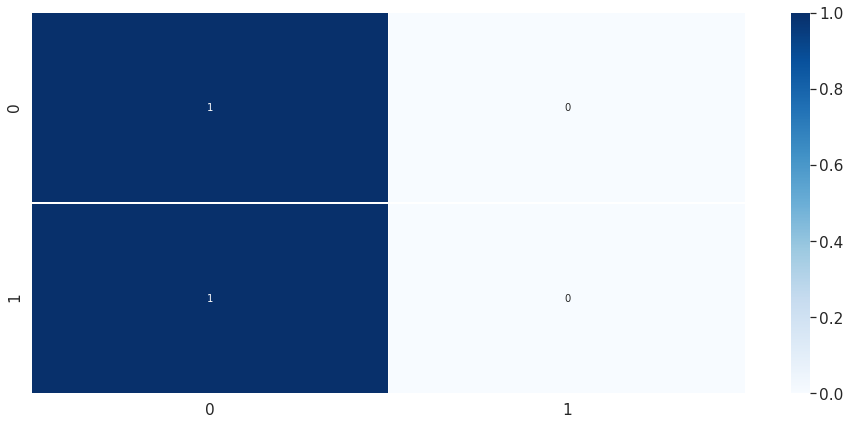

In [ ]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test_loc, y_pred_test)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)


In [ ]:
y_pred,y_pred_prob ,score = model_random_forecast(X_train_loc,X_train_loc,y_train_loc)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.8s finished


CPU times: user 265 ms, sys: 28.2 ms, total: 293 ms
Wall time: 1.03 s
Random forecast classifier...
Best CV Score: 0.8752


In [ ]:
#model evaluation
round(roc_auc_score(y_train_loc, y_pred), 2)

0.93

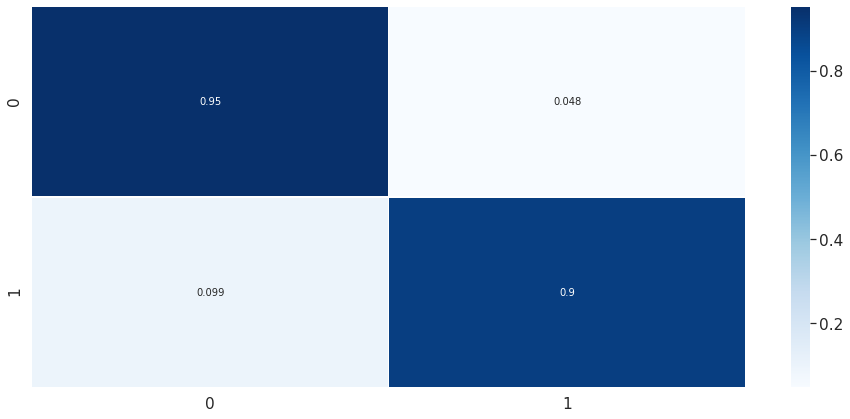

In [ ]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_train_loc, y_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)


In [ ]:
X_train_pos['ad_loc'] = y_pred
X_test_pos['ad_loc'] = y_pred_test

In [ ]:
def objective(trial):
    """function for optimising machine learning classifiers and their respective hyperparameters
    Arg
    ---
       trial: trial is a process of evaluating an objective function. This object is passed to an objective 
              function and provides interfaces to get parameter suggestion.
    """

    #define the trial suggested classifiers
    classifier_name = trial.suggest_categorical("classifier", ["SVC", "RandomForest"]) 
    #conditionals for classifier hyper-parameter optimisation
    if classifier_name == "SVC":
        #support vector clssiffier hyper-parameters 
        svr_c = trial.suggest_loguniform('svr_c', 1e-10, 1e10)
        # define svc model
        classifier_obj = sklearn.svm.SVC(C=svr_c, probability=True)
        # trial.set_user_attr(key="best_model", value=svm)

    else:
        #rf hype-parameters
        rf_max_depth = trial.suggest_int("rf_max_depth", 2, 32, log=True)
        n_est = trial.suggest_int("n_est",10, 150)
        # w = trial.suggest_int('w',1,10)
        # w_1 = trial.suggest_int('w_1',1,10)
        min_sleaf = trial.suggest_int("min_sleaf",1, 5)
        classifier_obj = sklearn.ensemble.RandomForestClassifier(max_depth=rf_max_depth, n_estimators=n_est, min_samples_leaf=min_sleaf)
    

    score = sklearn.model_selection.cross_val_score(classifier_obj, X_train_2, y_train_2, n_jobs=-1, cv=3, scoring = 'roc_auc_ovr')
    best_auroc = score.mean()
    return best_auroc

if __name__ == "__main__":
    # Make the sampler behave in a deterministic way.
    sampler = TPESampler(seed=2)
    #configure the study
    study = optuna.create_study(direction="maximize", sampler=sampler)
    #define number of trials to perform
    study.optimize(objective, n_trials=100)
    #print the best trial results
    print(study.best_trial)

[I 2021-02-15 09:53:02,840] A new study created in memory with name: no-name-7a220ba1-5736-4b21-8ba2-87a74b9d6ffc
[I 2021-02-15 09:53:03,335] Trial 0 finished with value: 0.20513990190458511 and parameters: {'classifier': 'SVC', 'svr_c': 5.03085225753886e-07}. Best is trial 0 with value: 0.20513990190458511.
[I 2021-02-15 09:53:03,569] Trial 1 finished with value: 0.9016969772386814 and parameters: {'classifier': 'SVC', 'svr_c': 9.84576708141957}. Best is trial 1 with value: 0.9016969772386814.
[I 2021-02-15 09:53:03,853] Trial 2 finished with value: 0.8632849314807677 and parameters: {'classifier': 'SVC', 'svr_c': 0.49542958315847585}. Best is trial 1 with value: 0.9016969772386814.
[I 2021-02-15 09:53:04,444] Trial 3 finished with value: 0.9744921883383005 and parameters: {'classifier': 'RandomForest', 'rf_max_depth': 4, 'n_est': 105, 'min_sleaf': 4}. Best is trial 3 with value: 0.9744921883383005.
[I 2021-02-15 09:53:04,664] Trial 4 finished with value: 0.9273972750064771 and parame

FrozenTrial(number=51, values=[0.9901243197886046], datetime_start=datetime.datetime(2021, 2, 15, 10, 20, 11, 675895), datetime_complete=datetime.datetime(2021, 2, 15, 10, 20, 12, 494965), params={'classifier': 'RandomForest', 'rf_max_depth': 19, 'n_est': 135, 'min_sleaf': 1}, distributions={'classifier': CategoricalDistribution(choices=('SVC', 'RandomForest')), 'rf_max_depth': IntLogUniformDistribution(high=32, low=2, step=1), 'n_est': IntUniformDistribution(high=150, low=10, step=1), 'min_sleaf': IntUniformDistribution(high=5, low=1, step=1)}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=51, state=TrialState.COMPLETE, value=None)


In [ ]:
study.best_trial.params['rf_max_depth']

4

In [ ]:
def model_random_forecast(X_train,X_test,y_train):
    """function that trains the modela and thereafter predicts the target variable on the test-set using the RandomForestClassifier.
    Args
    ----
        X_train (DataFrame): dataframe of training-set independet features.
        X_test (DataFrame): dataframe of test-set independent features.
        y_train (DataFrame): dataframe of training-set dependet features.
    Returns:
            y_pred (np.array): array of test-set predicted variable.
            -model.best_score_ (float): best AUC obtained during training
    """
    #study.best_trial.params['n_est'] 
    weights = {1:1, 2:1.0, 3:2.0, 4:5.0, 0:10.0}
    rfr = sklearn.ensemble.RandomForestClassifier(n_jobs=-1, random_state=0, bootstrap=False, class_weight='balanced') #, class_weight={0:3, 1:110}
    param_grid = {'n_estimators':[study.best_trial.params['n_est']], 'max_features': ['auto'], 'max_depth':[study.best_trial.params['rf_max_depth']], 'min_samples_leaf':[study.best_trial.params['min_sleaf']]}
    model = GridSearchCV(estimator=rfr, param_grid=param_grid, n_jobs=-1, cv=3, scoring='roc_auc_ovr',verbose=-1)
    %time model.fit(X_train, y_train)
    print('Random forecast classifier...')
    print('Best CV Score: {}'.format(round(model.best_score_,4)))

    y_pred_prob = model.predict_proba(X_test)
    y_pred = model.predict(X_test)
    return y_pred,y_pred_prob, round(model.best_score_,3)

In [ ]:
y_pred_pos,y_pred_prob_pos ,score = model_random_forecast(X_train_2,X_test_pos,y_train_2)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.1s finished


CPU times: user 720 ms, sys: 34.7 ms, total: 755 ms
Wall time: 1.58 s
Random forecast classifier...
Best CV Score: 0.9908


In [ ]:


# You need the labels to binarize
labels = [0, 1, 2, 3, 4]

ytest  = list(y_test_pos)
# Binarize ytest with shape (n_samples, n_classes)
ytest = label_binarize(ytest, classes=labels)

# Binarize ypreds with shape (n_samples, n_classes)
ypreds = label_binarize(y_pred_pos, classes=labels)


roc_auc_score(ytest, ypreds,average='macro',multi_class='ovr')

0.6111776747939877

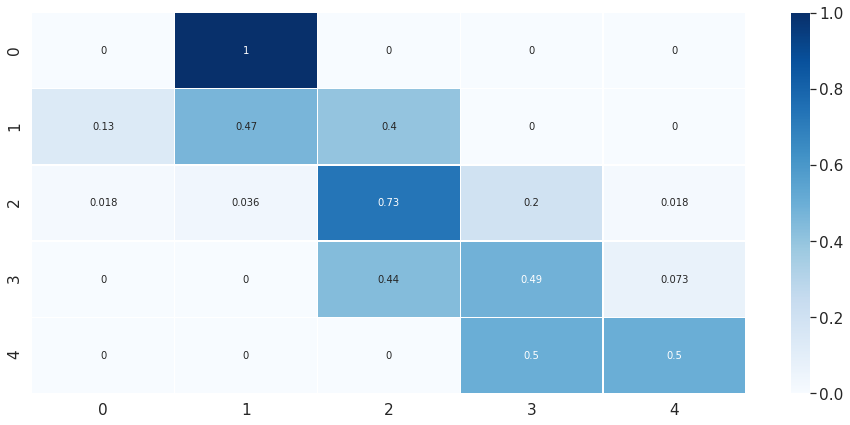

In [ ]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test_pos, y_pred_pos)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)


In [ ]:
y_pred_prob[5][3] , y_pred_prob[5][2]

(0.35332239635717894, 0.2814086349042871)

In [ ]:
y_pred_prob[5].argmax()

3

In [ ]:
y_pred_ = []
for i in range(len(y_pred_prob)):
  y_pred_.append(y_pred_prob[i].argmax())

In [ ]:
diff = []
for i in range(len(y_pred_prob)):
  diff = y_pred_prob[i][3] - y_pred_prob[i][2]
  if diff > -0.1:
    y_pred_prob[i][2] += -0.2
  # diff_two = y_pred_prob[i][4] - y_pred_prob[i][3]
  # if diff_two > -0.19:
  #   y_pred_prob[i][3] += -0.19
  # diff_three = y_pred_prob[i][1] - y_pred_prob[i][0]
  # if diff_three > -0.19:
  #   y_pred_prob[i][1] += -0.19


In [ ]:
diff[:10]

[0.004720474890986537,
 0.17717710932294428,
 0.06337179253796027,
 0.2518669843075382,
 0.30166621488059947,
 0.11808623854710815,
 0.27888978683372,
 0.3486510772962427,
 0.31018596111698704,
 0.3355281217569951]

In [ ]:
y_test[5]

3

In [ ]:
y_pred_prob[5].argmax()

2

In [ ]:
y_pred,y_pred_prob ,score = model_random_forecast(X_train_loc,X_test_loc,y_train_loc)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.8s finished


CPU times: user 223 ms, sys: 24.4 ms, total: 247 ms
Wall time: 1.01 s
Random forecast classifier...
Best CV Score: 0.8797


In [ ]:
#model evaluation
round(roc_auc_score(y_test_loc, y_pred), 2)

0.84

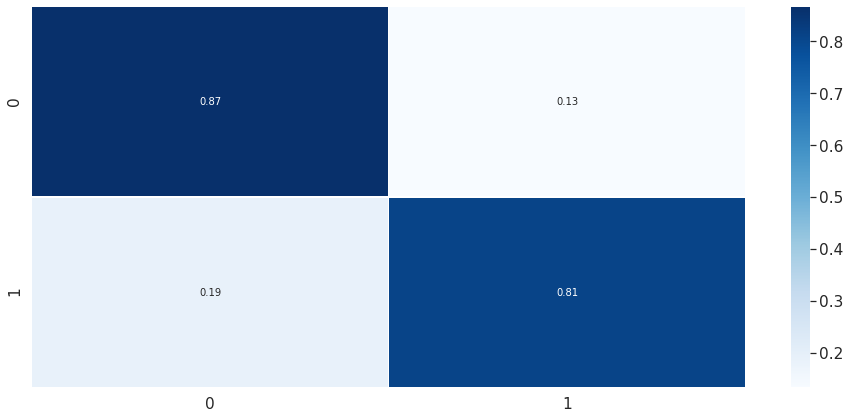

In [ ]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test_loc, y_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)


In [ ]:
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize

# You need the labels to binarize
labels = [0, 1, 2, 3, 4]

ytest  = list(y_test_loc)
# Binarize ytest with shape (n_samples, n_classes)
ytest = label_binarize(ytest, classes=labels)

ypreds = [1,2,1,3,2,2,0,1,1]

# Binarize ypreds with shape (n_samples, n_classes)
ypreds = label_binarize(y_pred, classes=labels)


roc_auc_score(ytest, ypreds,average='macro',multi_class='ovo')

ValueError: ignored

In [ ]:
# from sklearn.metrics import roc_auc_score
# from sklearn.preprocessing import label_binarize

# # You need the labels to binarize
# labels = [0, 1, 2, 3]

# ytest  = [0,1,2,3,2,2,1,0,1]

# # Binarize ytest with shape (n_samples, n_classes)
# ytest = label_binarize(ytest, classes=labels)

# ypreds = [1,2,1,3,2,2,0,1,1]

# # Binarize ypreds with shape (n_samples, n_classes)
# ypreds = label_binarize(ypreds, classes=labels)


# roc_auc_score(ytest, ypreds,average='macro',multi_class='ovo')

In [ ]:
for i in range(len(y_pred_prob)):
  if y_pred_prob[i][1] >= y_pred_prob[i][0] and y_pred_prob[i][0] > 0.3:
    y_pred_prob[i][0] = 1

In [ ]:
y_pred_two = []
for i in range(len(y_pred_prob)):
  y_pred_two.append(y_pred_prob[i].argmax())

In [ ]:
y_test_loc[210]

0

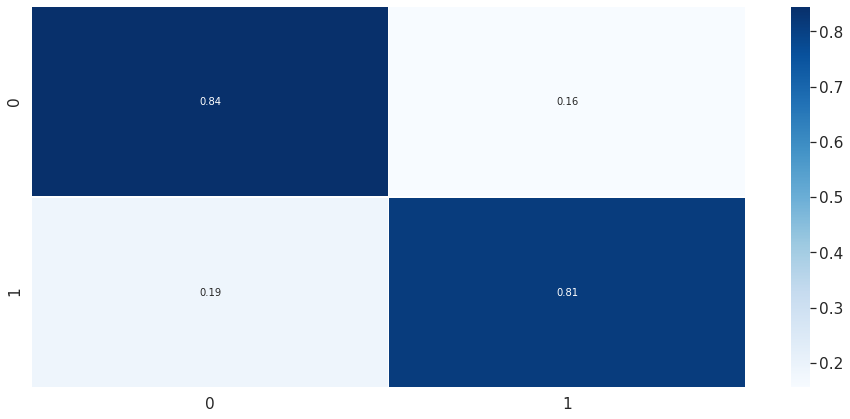

In [ ]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test_loc, y_pred)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Blues, linewidths=0.2)


In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, precision_recall_curve, auc

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, precision_recall_curve
#model evaluation
round(roc_auc_score(y_test, y_pred, multi_class="ovr"), 2)

AxisError: ignored

In [ ]:
md = data.groupby(['month','day_of_week'], as_index=False).agg({'clicks': ['mean', 'min','max'], 
                  'cost': ['mean', 'min','max'], 'conversion_value': ['mean', 'min','max'],
                   'impressions': ['mean', 'min','max'], 'conversions': ['mean', 'min','max']})
data = pd.merge(data, md, how='left', on= ['month','day_of_week'])
# md = data.groupby(['month','day_of_week'], as_index=False).agg({'clicks': ['mean', 'min','max']})